#### ribosomal, mt, cell cycle genes removed

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scanpy.external as sce

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, color_map = 'viridis_r')

/home/teach2_pkuhpc/gpfs1/xuzk/Anaconda/envs/py_3.8/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.8.2 anndata==0.7.8 umap==0.5.3 numpy==1.21.6 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.6


In [3]:
T_file = 'write_LCA/h_LCA1-5_T.h5ad'
T_file_v2 = 'write_LCA/h_LCA1-5_T_v2.h5ad' # mt, ribosomal, cell-cycle genes removed, raw: unregressed and unscaled
T_file_v3 = 'write_LCA/h_LCA1-5_T_v3.h5ad' # regressed and scaled

# identifying subsets of T cells

In [4]:
adata_T=sc.read_h5ad(T_file_v2)
#adata_T=sc.read_h5ad(T_file)

In [5]:
adata_T

AnnData object with n_obs × n_vars = 11002 × 4251
    obs: 'Barcode', 'Patient', 'Library', 'Most_likely_LM22_cell_type', 'Major_cell_type', 'Minor_subset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'label_singleR', 'leiden', 'lymphoid', 'label_rough'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Major_cell_type_colors', 'Most_likely_LM22_cell_type_colors', 'Patient_colors', 'hvg', 'label_rough_colors', 'label_singleR_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
adata_T = adata_T.raw.to_adata()
adata_T

AnnData object with n_obs × n_vars = 11002 × 41861
    obs: 'Barcode', 'Patient', 'Library', 'Most_likely_LM22_cell_type', 'Major_cell_type', 'Minor_subset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'label_singleR', 'leiden', 'lymphoid', 'label_rough'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Major_cell_type_colors', 'Most_likely_LM22_cell_type_colors', 'Patient_colors', 'hvg', 'label_rough_colors', 'label_singleR_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'

In [50]:
# calculate cell cycle 
#sc.tl.score_genes_cell_cycle(adata_T, s_genes, g2m_genes)

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
False    37643
True      4218
Name: highly_variable, dtype: int64


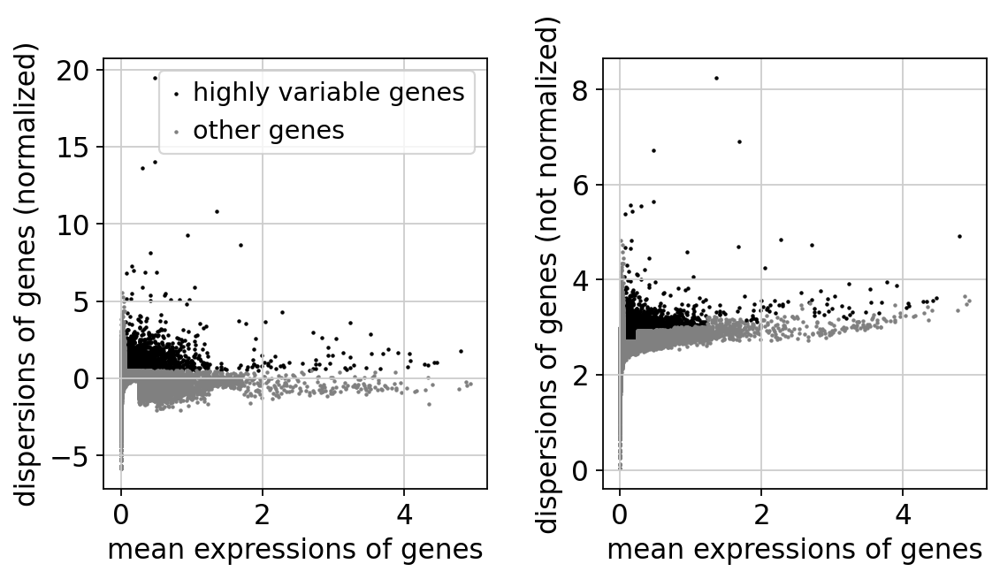

In [7]:
adata_T.uns['log1p']={'base': None}
sc.pp.highly_variable_genes(adata_T, min_mean=0.05, max_mean=8, min_disp=0.5) 
print(adata_T.var['highly_variable'].value_counts(normalize=False))
sc.pl.highly_variable_genes(adata_T)

#### remove mt genes, cell cycle genes, ribosomal genes

In [8]:
## cell cycle genes
s_genes = open("write_LCA/human_S.txt").read().splitlines()
g2m_genes = open("write_LCA/human_G2M.txt").read().splitlines()
# remove cell cycle genes
all_genes = list(adata_T.var_names)
retained_genes = [x for x in all_genes if x not in s_genes]
retained_genes = [x for x in retained_genes if x not in g2m_genes]

In [9]:
## ribosomal genes
rib_genes = [x for x in all_genes if (x.startswith('RPS') or x.startswith('RPL'))]
mrib_genes = [x for x in all_genes if (x.startswith('MRPS') or x.startswith('MRPL'))]
## remove ribosomal genes
retained_genes = [x for x in retained_genes if x not in rib_genes]
retained_genes = [x for x in retained_genes if x not in mrib_genes]

In [10]:
adata_T = adata_T[:,retained_genes]
adata_T
## 279 genes removed

View of AnnData object with n_obs × n_vars = 11002 × 41582
    obs: 'Barcode', 'Patient', 'Library', 'Most_likely_LM22_cell_type', 'Major_cell_type', 'Minor_subset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'label_singleR', 'leiden', 'lymphoid', 'label_rough'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Major_cell_type_colors', 'Most_likely_LM22_cell_type_colors', 'Patient_colors', 'hvg', 'label_rough_colors', 'label_singleR_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap'

In [11]:
## remove mitochondrial genes
adata_T = adata_T[:,adata_T.var['mt']==False]
adata_T
## 37 genes removed

View of AnnData object with n_obs × n_vars = 11002 × 41545
    obs: 'Barcode', 'Patient', 'Library', 'Most_likely_LM22_cell_type', 'Major_cell_type', 'Minor_subset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'label_singleR', 'leiden', 'lymphoid', 'label_rough'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Major_cell_type_colors', 'Most_likely_LM22_cell_type_colors', 'Patient_colors', 'hvg', 'label_rough_colors', 'label_singleR_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap'

In [12]:
adata_T.var['highly_variable'].value_counts(normalize=False)
# 68 HVGs removed

False    37395
True      4150
Name: highly_variable, dtype: int64

In [13]:
adata_T.raw = adata_T
adata_T = adata_T[:, adata_T.var.highly_variable]

In [14]:
sc.pp.regress_out(adata_T, ['total_counts','pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:46)


In [15]:
sc.pp.scale(adata_T, max_value=10)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)


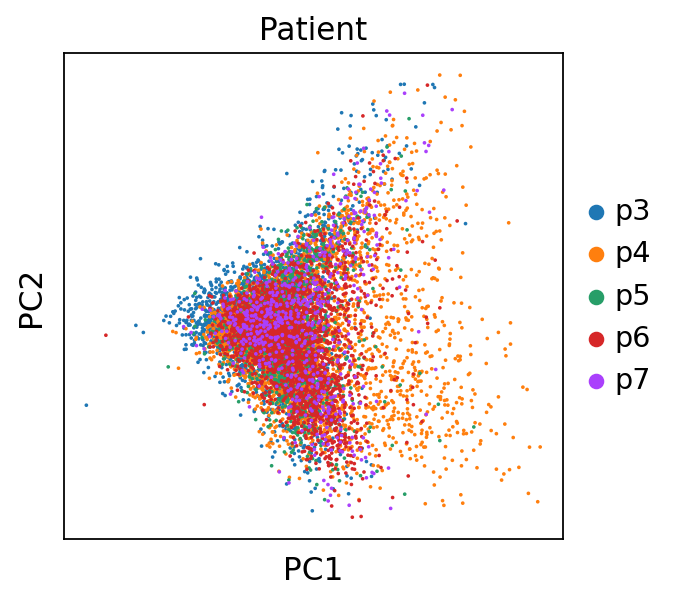

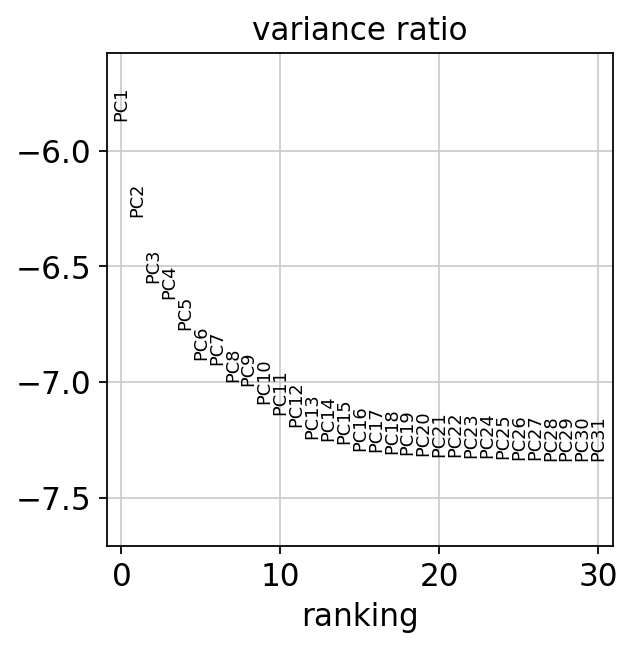

In [16]:
sc.tl.pca(adata_T, svd_solver='arpack')
sc.pl.pca(adata_T, color='Patient')
sc.pl.pca_variance_ratio(adata_T, log=True)

In [17]:
sc.pp.neighbors(adata_T, n_pcs=16)
sc.tl.umap(adata_T)

computing neighbors
    using 'X_pca' with n_pcs = 16
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


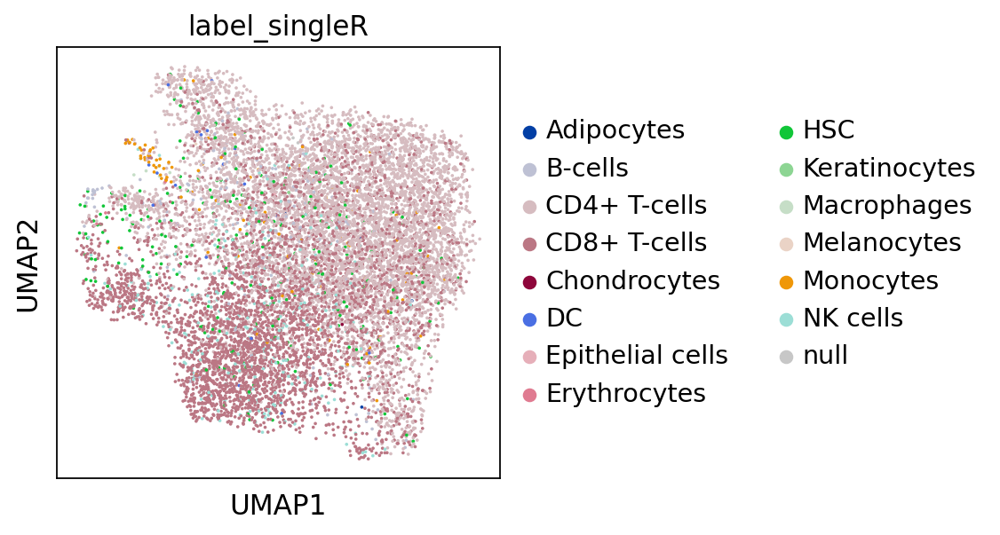

In [18]:
sc.pl.umap(adata_T, color='label_singleR')

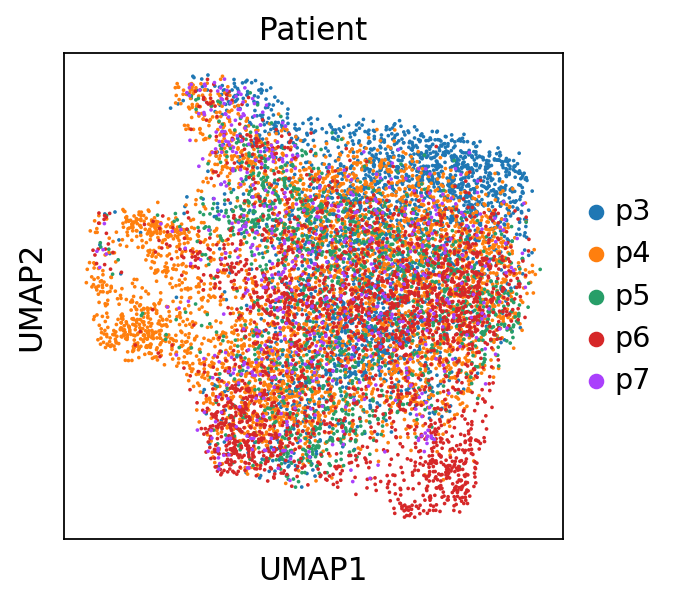

In [5]:
sc.pl.umap(adata_T, color='Patient')

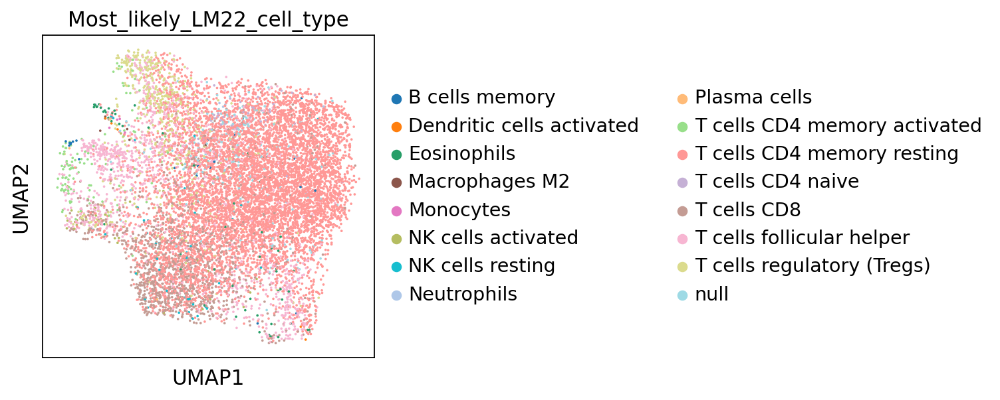

In [20]:
sc.pl.umap(adata_T, color='Most_likely_LM22_cell_type')

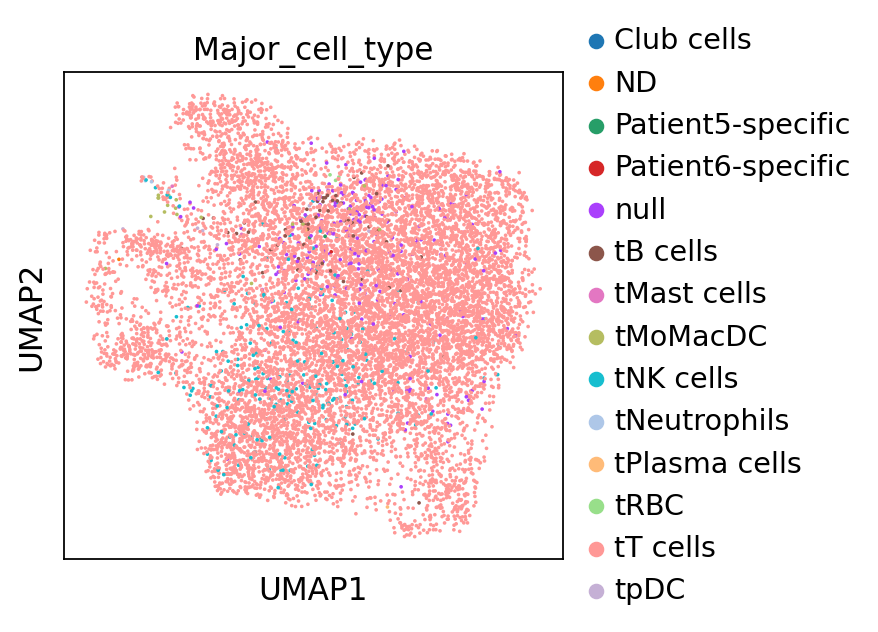

In [22]:
sc.pl.umap(adata_T, color='Major_cell_type')

# clustering and DEG detection

In [21]:
sc.tl.leiden(adata_T, resolution = 2.5)
## 细分+看heatmap

running Leiden clustering
    finished: found 37 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


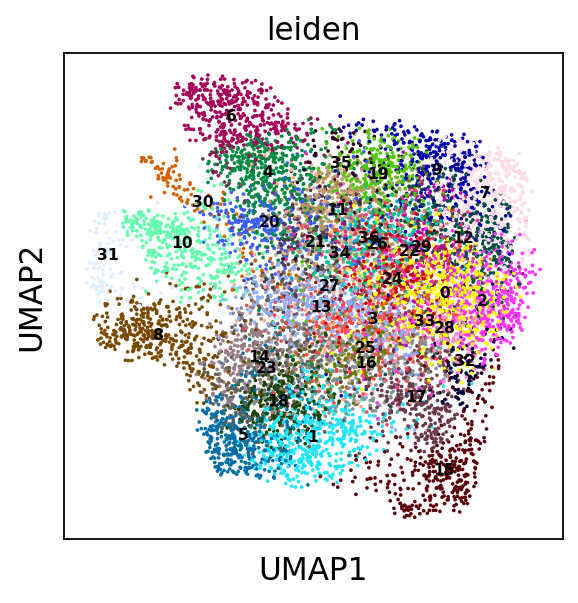

In [25]:
sc.pl.umap(adata_T, color='leiden',legend_loc = 'on data', legend_fontsize=7)
#sc.pl.umap(adata_T, color='leiden',legend_fontsize=9)

In [21]:
sc.tl.rank_genes_groups(adata_T, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_T, n_genes=25, sharey=False)

# define subclusters

In [4]:
adata=sc.read_h5ad(T_file_v3)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [26]:
### calculate scaled counts of all genes for visualization
adata=adata_T.raw.to_adata()
sc.pp.regress_out(adata, ['total_counts','pct_counts_mt'])# 这一步极慢，因为是对于全部的基因操作
sc.pp.scale(adata)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


regressing out ['total_counts', 'pct_counts_mt']
    finished (0:05:11)


In [27]:
adata.obs['leiden']=adata_T.obs['leiden']

In [29]:
sc.tl.dendrogram(adata,groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


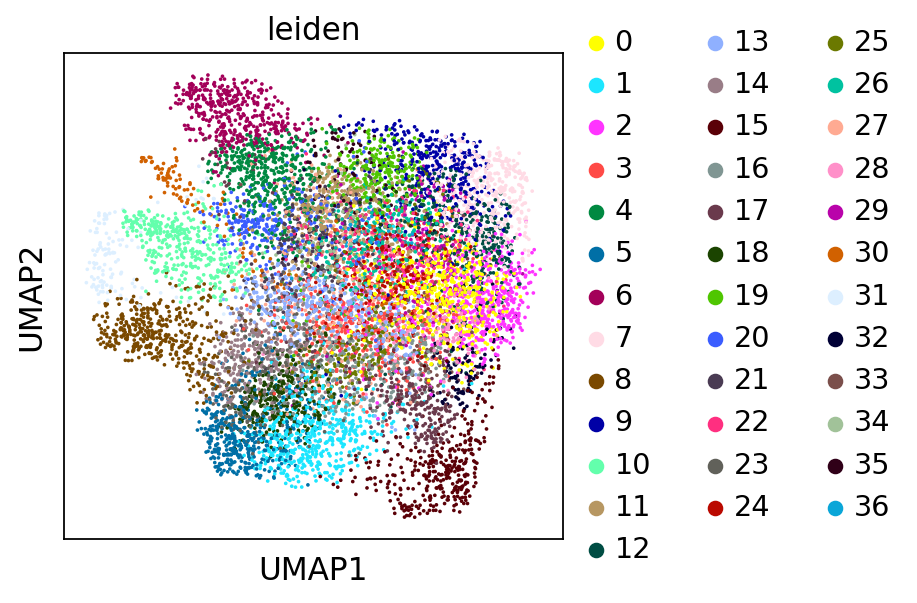

In [30]:
sc.pl.umap(adata, color='leiden')


In [22]:
## heatmap of normalized data
#sc.pl.heatmap(adata, var_names=marker_genes_dict,groupby='leiden',dendrogram=True, use_raw=False,swap_axes=True,cmap='viridis',
            # vmax=6,vmin=0)
#sc.pl.heatmap(adata, var_names=marker_genes_dict,groupby='leiden',dendrogram=True, use_raw=False,swap_axes=True,cmap='RdBu_r', vmax=2, vmin=-1)

In [6]:
# markers for cell lineages
marker_genes_dict = {
    'CD4': ['CD4','IL7R'],
    'CD8': ['CD8A','CD8B'],
    'naive markers': ['TCF7','SELL','LEF1','CCR7'],
    'exhausted/inhbitory': ['LAG3','TIGIT','PDCD1','HAVCR2','CTLA4'],
    'cytotoxic/effector': ['IL2','GZMA','GNLY','PRF1','GZMB','GZMK','IFNG','NKG7'],
    'Treg': ['IL2RA','FOXP3','IKZF2'],
    'Tfh': ['MAF','CXCL13','CXCR5','PDCD1'],
    'Th17':['IRF4','CREM','NR4A2'],
    'Th1':['STAT4','IL12RB2','IFNG'],
    'Th2':['GATA3','STAT6','IL4'],
    'gamma-delta T':['TRDC','TRGC2','TRGC1']
}

categories: 0, 1, 2, etc.
var_group_labels: CD4, CD8, naive markers, etc.


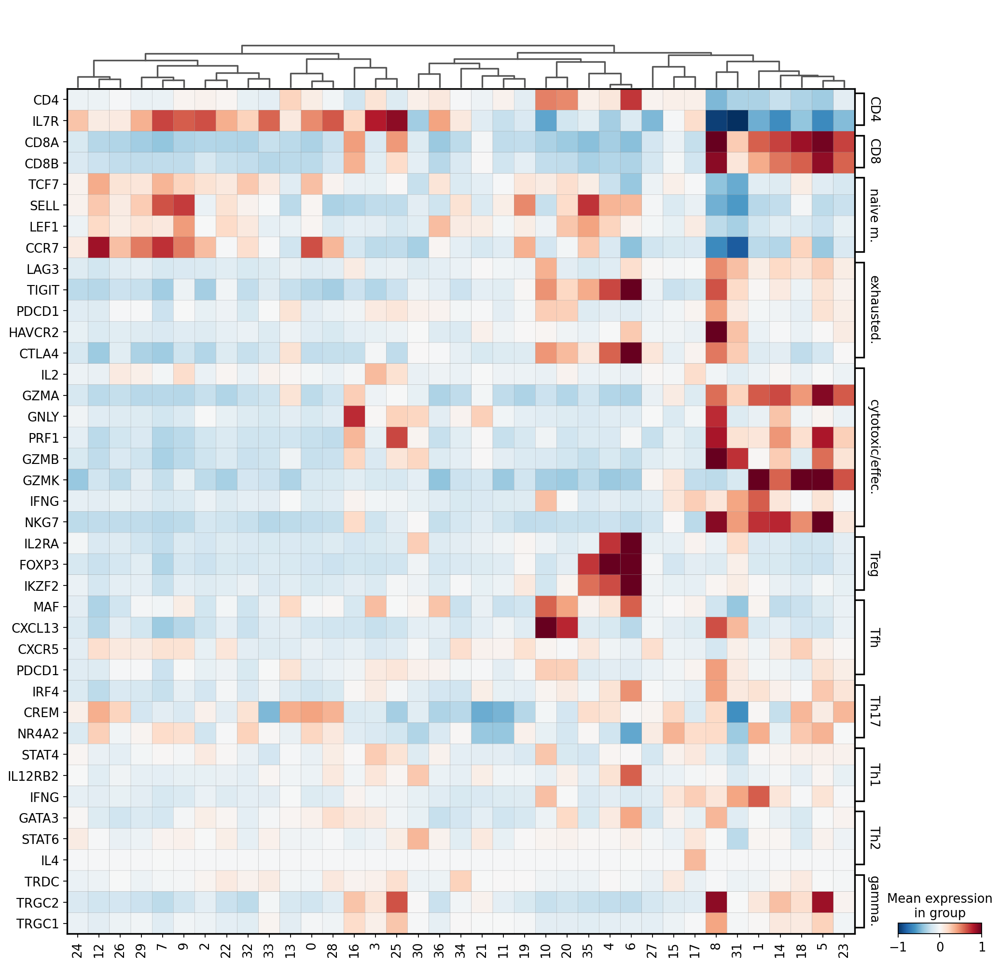

In [31]:
## matrixplot of normalized data
sc.pl.matrixplot(adata, var_names=marker_genes_dict,groupby='leiden', dendrogram=True, use_raw=False,swap_axes=True,cmap='RdBu_r',vmax=1, vmin=-1)

1,14,18,5,23: CD8+ cytotoxic 1

16, 25: CD8+ cytotoxic 2 (IL7R)

8, 31: CD8+ cytotoxic & exhausted

34, 4, 6: CD4+ Treg

10, 20: CD4+ Tfh

12, 26, 29, 7, 9: CD4+ naive T

other: CD4+ undefined T

根据自动注释30可能是monocyte，去除之



In [27]:
# remove leiden 30 
# 11002-10869 = 133
adata_T = adata_T[adata_T.obs['leiden']!='30',:]

In [28]:
# create a dictionary to map cluster to subtype annotation label
cluster2annotation = {
     '0': 'h-CD4+ undefined T',
    '1': 'h-CD8+ cytotoxic 1', 
    '2':'h-CD4+ undefined T',
    '3':'h-CD4+ undefined T',
    '4': 'h-CD4+ Treg',
    '5':'h-CD8+ cytotoxic 1',
    '6':'h-CD4+ Treg',
    '7':'h-CD4+ naive T',
    '8':'h-CD8+ cytotoxic & exhausted',
    '9':'h-CD4+ naive T',
    '10':'h-CD4+ Tfh',
    '11':'h-CD4+ undefined T',
    '12':'h-CD4+ naive T',
    '13':'h-CD4+ undefined T',
    '14':'h-CD8+ cytotoxic 1',
    '15':'h-CD4+ undefined T',
    '16':'h-CD8+ cytotoxic 2 (IL7R)',
    '17':'h-CD4+ undefined T',
    '18':'h-CD8+ cytotoxic 1',
    '19':'h-CD4+ undefined T',
    '20':'h-CD4+ Tfh',
    '21':'h-CD4+ undefined T',
    '22':'h-CD4+ undefined T',
    '23':'h-CD8+ cytotoxic 1',
    '24':'h-CD4+ undefined T',
    '25':'h-CD8+ cytotoxic 2 (IL7R)',
    '26':'h-CD4+ naive T',
    '27':'h-CD4+ undefined T',
    '28':'h-CD4+ undefined T',
    '29':'h-CD4+ naive T',
    #'30':'h-CD4+ undefined T',
    '31':'h-CD8+ cytotoxic & exhausted',
    '32':'h-CD4+ undefined T',
    '33':'h-CD4+ undefined T',
    '34':'h-CD4+ Treg',
    '35':'h-CD4+ undefined T',
    '36':'h-CD4+ undefined T'
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata_T.obs['label_subtype'] = adata_T.obs['leiden'].map(cluster2annotation).astype('category')

Trying to set attribute `.obs` of view, copying.


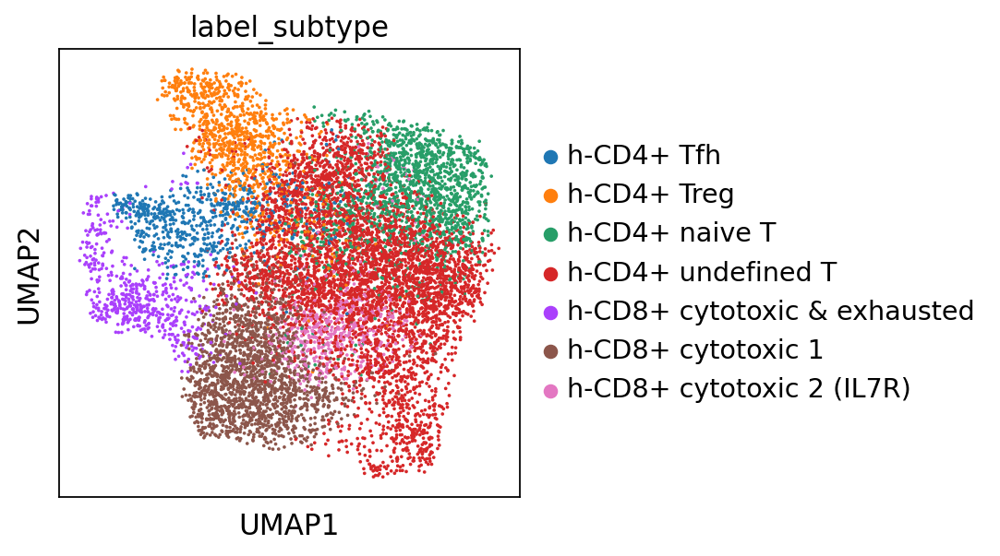

In [29]:
sc.pl.umap(adata_T, color='label_subtype')

In [18]:
# markers for cell lineages
marker_genes_dict_1 = {
    'CD4': ['CD4','IL7R'],
    'CD8': ['CD8A','CD8B'],
    'naive markers': ['TCF7','SELL','LEF1','CCR7'],
    'TEM/TRM':['CCR5','CCR3','IL7R'],
    'exhausted/inhbitory': ['LAG3','TIGIT','PDCD1','HAVCR2','CTLA4'],
    'cytotoxic/effector': ['IL2','GZMA','GNLY','PRF1','GZMB','GZMK','IFNG','NKG7'],
    'Treg': ['IL2RA','FOXP3','IKZF2'],
    'Tfh': ['STAT3','BCL6','MAF','CXCL13','CXCR5','PDCD1'],
    'Th17':['STAT3','RORC','IL17A','IRF4','CREM','NR4A2'],
    'Th1':['STAT1','STAT4','TBX21','IL12RB2','IFNG'],
    'Th2':['GATA3','STAT6','IL4','IL5','IL13'],
    'Th9':['IL9','IL10','IFNG'],
    'gamma-delta T':['TRDC','TRGC2','TRGC1']
    
}

categories: 0, 1, 2, etc.
var_group_labels: CD4, CD8, naive markers, etc.


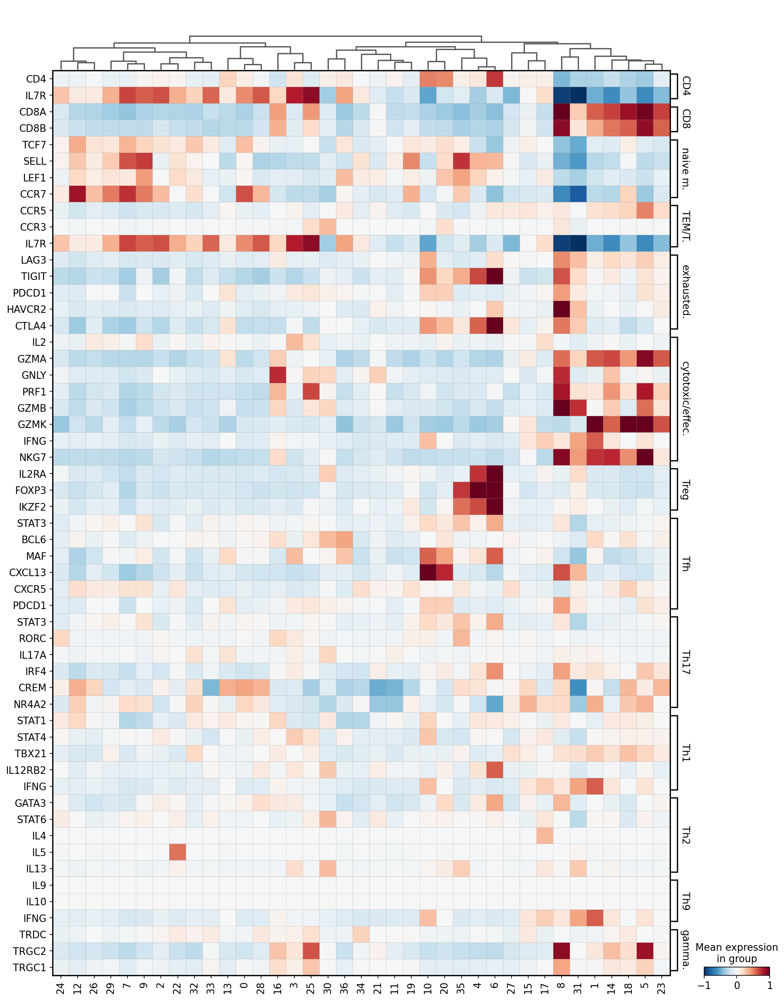

In [19]:
## matrixplot of normalized data
sc.pl.matrixplot(adata, var_names=marker_genes_dict_1,groupby='leiden', dendrogram=True, use_raw=False,swap_axes=True,cmap='RdBu_r',vmax=1, vmin=-1)

更细的分类：

1,14,18,5,23: CD8+ cytotoxic 1

16, 25: CD8+ cytotoxic 2 (IL7R, gamma-delta)

8: CD8+ cytotoxic & exhausted (gamma-delta)

31: CD8+ cytotoxic & exhausted

34, 4, 6: Treg

10, 20: Tfh

12, 26, 29, 7, 9: CD4+ naive T

22: Th2-like

0,13,24,28,32: Th17-like

other: CD4+ undefined T

In [22]:
#create a dictionary to map cluster to subtype annotation label
cluster2annotation = {
     '0': 'h-Th17-like',
    '1': 'h-CD8+ cytotoxic 1', 
    '2':'h-CD4+ undefined T',
    '3':'h-CD4+ undefined T',
    '4': 'h-CD4+ Treg',
    '5':'h-CD8+ cytotoxic 1',
    '6':'h-CD4+ Treg',
    '7':'h-CD4+ naive T',
    '8':'h-CD8+ cytotoxic & exhausted (gamma-delta)',
    '9':'h-CD4+ naive T',
    '10':'h-CD4+ Tfh',
    '11':'h-CD4+ undefined T',
    '12':'h-CD4+ naive T',
    '13':'h-Th17-like',
    '14':'h-Th17-like',
    '15':'h-CD4+ undefined T',
    '16':'h-CD8+ cytotoxic 2 (IL7R, gamma-delta)',
    '17':'h-CD4+ undefined T',
    '18':'h-CD8+ cytotoxic 1',
    '19':'h-CD4+ undefined T',
    '20':'h-CD4+ Tfh',
    '21':'h-CD4+ undefined T',
    '22':'h-Th2-like',
    '23':'h-CD8+ cytotoxic 1',
    '24':'h-CD4+ undefined T',
    '25':'h-CD8+ cytotoxic 2 (IL7R, gamma-delta)',
    '26':'h-CD4+ naive T',
    '27':'h-CD4+ undefined T',
    '28':'h-Th17-like',
    '29':'h-CD4+ naive T',
    #'30':'h-CD4+ undefined T',
    '31':'h-CD8+ cytotoxic & exhausted',
    '32':'h-Th17-like',
    '33':'h-CD4+ undefined T',
    '34':'h-CD4+ Treg',
    '35':'h-CD4+ undefined T',
    '36':'h-CD4+ undefined T'
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata_T.obs['label_subtype_hres'] = adata_T.obs['leiden'].map(cluster2annotation).astype('category')

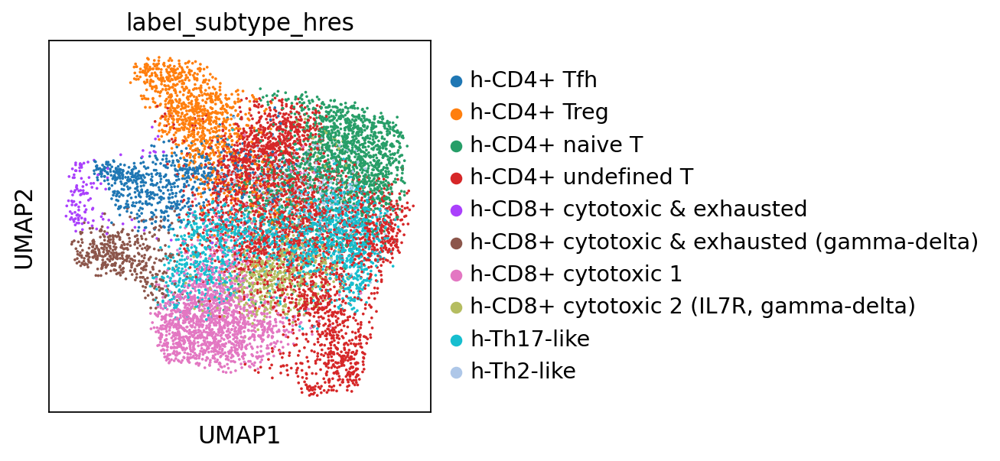

In [24]:
sc.pl.umap(adata_T, color='label_subtype_hres')

In [21]:
adata_T

AnnData object with n_obs × n_vars = 10869 × 4150
    obs: 'Barcode', 'Patient', 'Library', 'Most_likely_LM22_cell_type', 'Major_cell_type', 'Minor_subset', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'label_singleR', 'leiden', 'lymphoid', 'label_rough', 'label_subtype'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Major_cell_type_colors', 'Most_likely_LM22_cell_type_colors', 'Patient_colors', 'hvg', 'label_rough_colors', 'label_singleR_colors', 'label_subtype_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [41]:
adata.write(T_file_v3)

In [1]:
adata_T.write(T_file_v2)

NameError: name 'adata_T' is not defined

In [8]:
# markers for cell lineages
marker_genes_dict_1 = {
    'CD4': ['CD4','IL7R'],
    'CD8': ['CD8A','CD8B'],
    'naive markers': ['TCF7','SELL','LEF1','CCR7'],
    'exhausted/inhbitory': ['LAG3','TIGIT','PDCD1','HAVCR2','CTLA4'],
    'cytotoxic/effector': ['IL2','GZMA','GNLY','PRF1','GZMB','GZMK','IFNG','NKG7'],
    'Treg': ['IL2RA','FOXP3','IKZF2'],
    'Tfh': ['STAT3','MAF','CXCL13','PDCD1'],
    'Th17':['IRF4','CREM','NR4A2'],
    'Th2':['GATA3','STAT6','IL5'],
    'gamma-delta T':['TRDC','TRGC2','TRGC1']
    
}

In [12]:
adata=adata[adata.obs['leiden']!='30',:]

In [14]:
#create a dictionary to map cluster to subtype annotation label
cluster2annotation = {
     '0': 'h-Th17-like',
    '1': 'h-CD8+ cytotoxic 1', 
    '2':'h-CD4+ undefined T',
    '3':'h-CD4+ undefined T',
    '4': 'h-CD4+ Treg',
    '5':'h-CD8+ cytotoxic 1',
    '6':'h-CD4+ Treg',
    '7':'h-CD4+ naive T',
    '8':'h-CD8+ cytotoxic & exhausted (gamma-delta)',
    '9':'h-CD4+ naive T',
    '10':'h-CD4+ Tfh',
    '11':'h-CD4+ undefined T',
    '12':'h-CD4+ naive T',
    '13':'h-Th17-like',
    '14':'h-Th17-like',
    '15':'h-CD4+ undefined T',
    '16':'h-CD8+ cytotoxic 2 (IL7R, gamma-delta)',
    '17':'h-CD4+ undefined T',
    '18':'h-CD8+ cytotoxic 1',
    '19':'h-CD4+ undefined T',
    '20':'h-CD4+ Tfh',
    '21':'h-CD4+ undefined T',
    '22':'h-Th2-like',
    '23':'h-CD8+ cytotoxic 1',
    '24':'h-CD4+ undefined T',
    '25':'h-CD8+ cytotoxic 2 (IL7R, gamma-delta)',
    '26':'h-CD4+ naive T',
    '27':'h-CD4+ undefined T',
    '28':'h-Th17-like',
    '29':'h-CD4+ naive T',
    #'30':'h-CD4+ undefined T',
    '31':'h-CD8+ cytotoxic & exhausted',
    '32':'h-Th17-like',
    '33':'h-CD4+ undefined T',
    '34':'h-CD4+ Treg',
    '35':'h-CD4+ undefined T',
    '36':'h-CD4+ undefined T'
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['label_subtype_hres'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

Trying to set attribute `.obs` of view, copying.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


categories: h-CD4+ Tfh, h-CD4+ Treg, h-CD4+ naive T, etc.
var_group_labels: CD4, CD8, naive markers, etc.


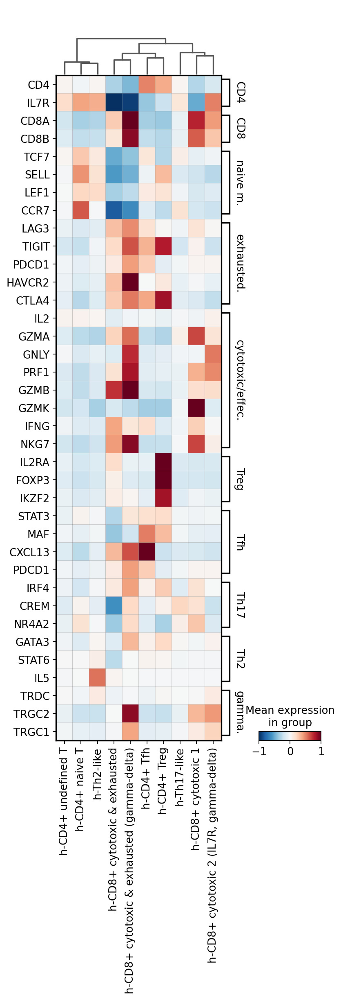

In [17]:
## matrixplot of normalized data
sc.pl.matrixplot(adata, var_names=marker_genes_dict_1,groupby='label_subtype_hres', dendrogram=True, use_raw=False,swap_axes=True,cmap='RdBu_r',vmax=1, vmin=-1)

In [21]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


categories: 0, 1, 2, etc.
var_group_labels: CD4, CD8, naive markers, etc.


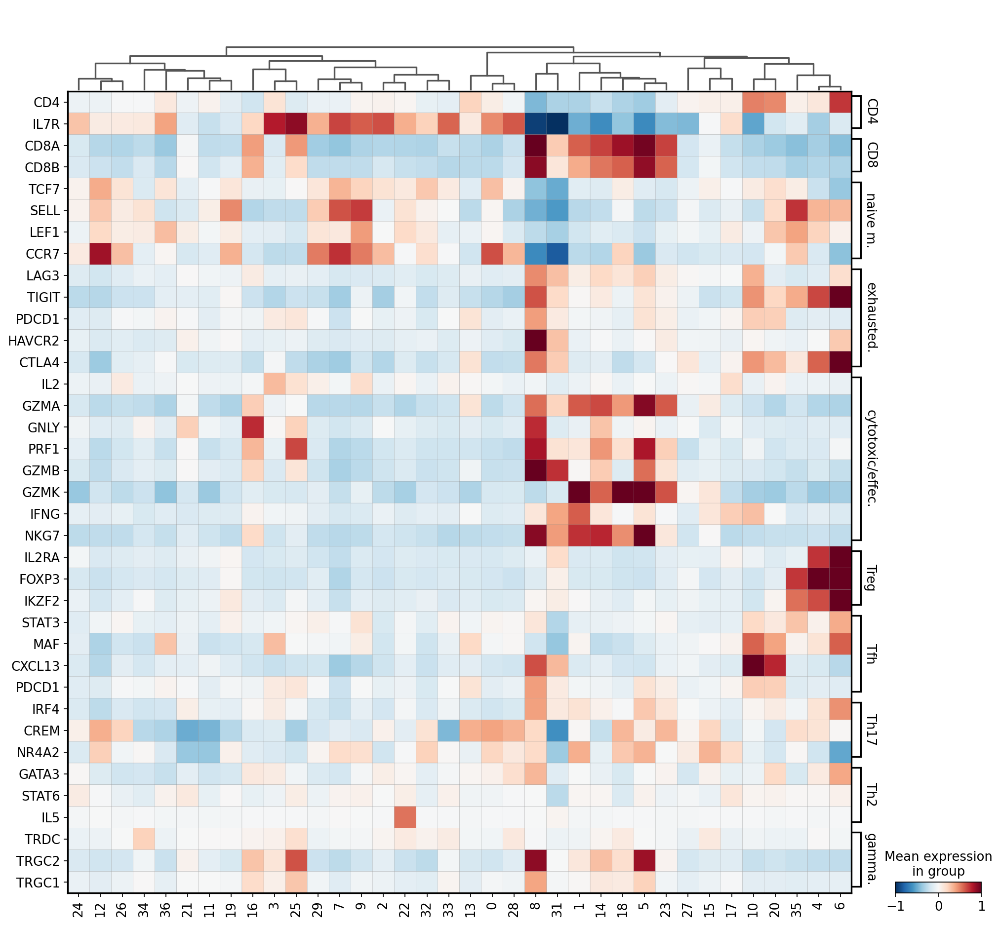

In [22]:
## matrixplot of normalized data
sc.pl.matrixplot(adata, var_names=marker_genes_dict_1,groupby='leiden', dendrogram=True, use_raw=False,swap_axes=True,cmap='RdBu_r',vmax=1, vmin=-1)

# lineage markers on umap

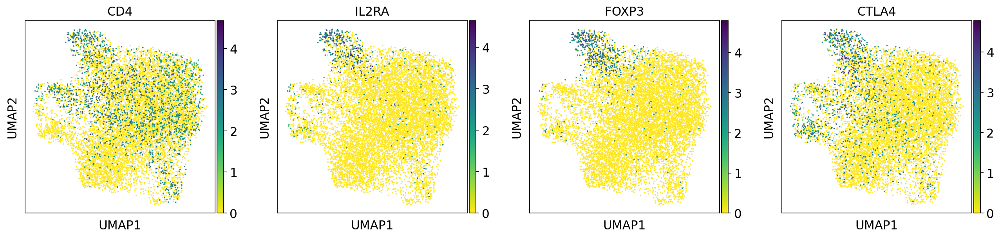

In [31]:
## look for Treg
## CD25即IL2RA 
sc.pl.umap(adata_T, color=['CD4','IL2RA','FOXP3','CTLA4'])

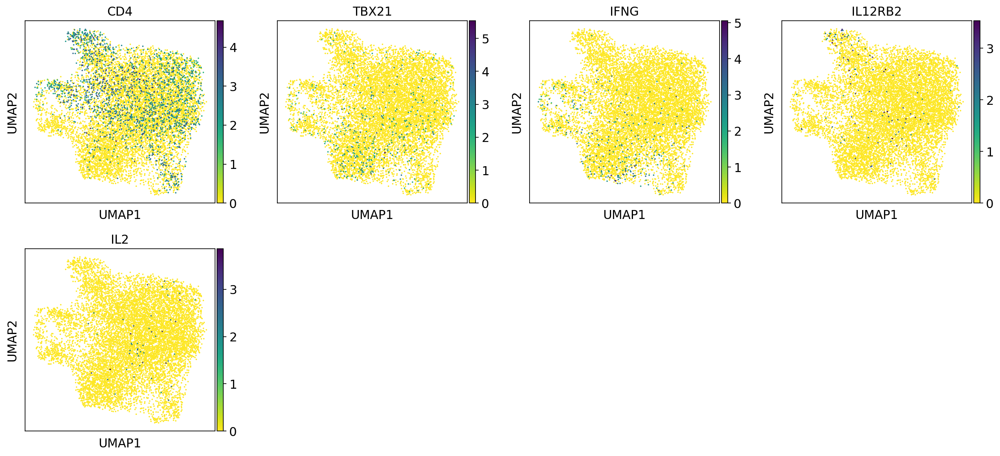

In [32]:
## look for Th1
## IFNG即IFN-γ,TBX21即T-bet
## CD4+ T 不表达IL2可能意味着遇到自身细胞
sc.pl.umap(adata_T, color=['CD4','TBX21','IFNG','IL12RB2','IL2'])

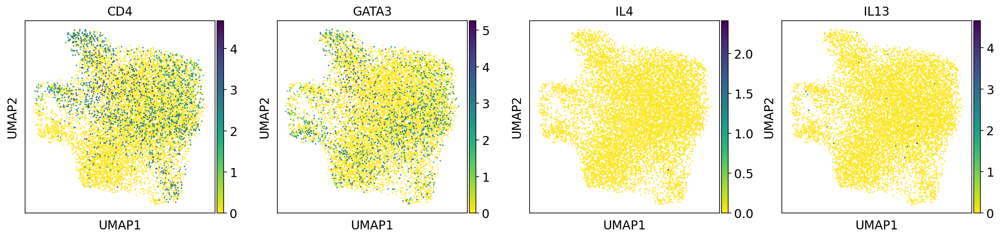

In [33]:
## look for Th2
sc.pl.umap(adata_T, color=['CD4','GATA3','IL4','IL13'])

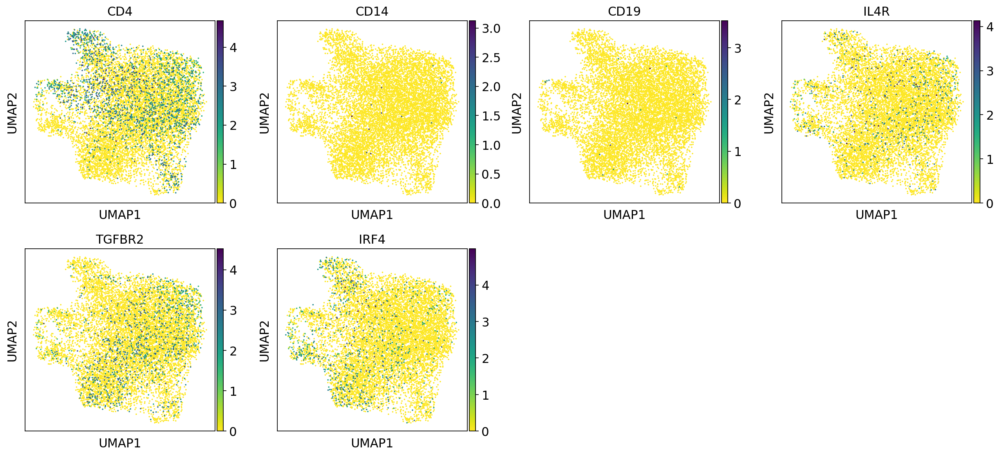

In [34]:
## look for Th9 
## 其中CD14- CD19-
## https://www.rndsystems.com/cn/resources/cell-markers/immune-cells/helper-t-cells/th9-cell-markers
sc.pl.umap(adata_T, color=['CD4','CD14','CD19','IL4R','TGFBR2','IRF4'])

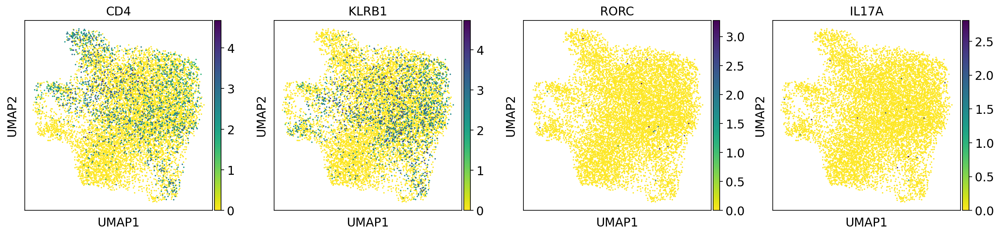

In [35]:
## look for Th17
## KLRB1 也是NK的marker
sc.pl.umap(adata_T, color=['CD4','KLRB1','RORC','IL17A'])

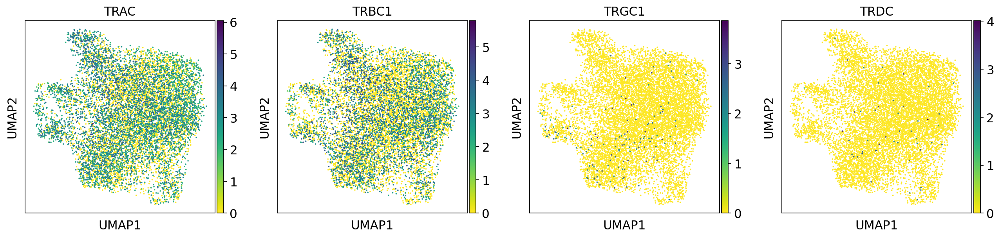

In [36]:
## look for gamma-delta T cells 几乎都被alpha beta覆盖，但应该是NK的地方零散地有一些TRDC表达？为什么？
sc.pl.umap(adata_T, color=['TRAC','TRBC1','TRGC1','TRDC'])

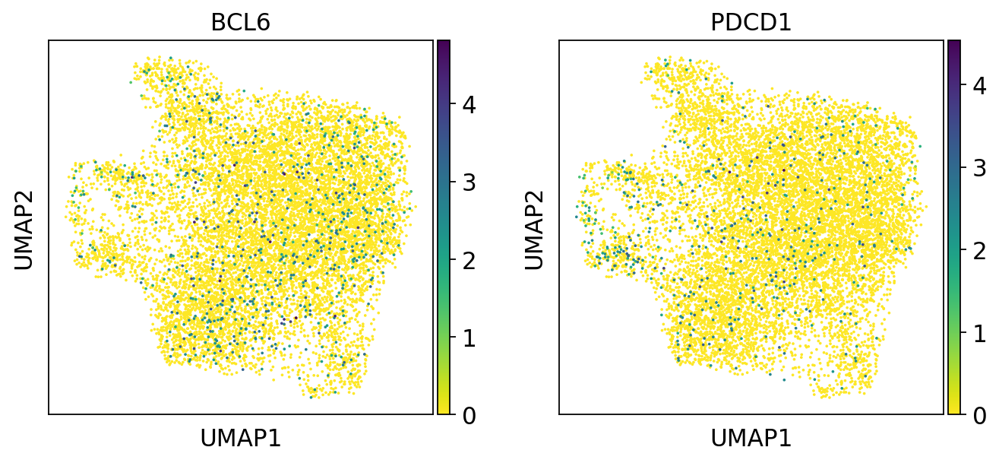

In [37]:
## look for Tfh 
sc.pl.umap(adata_T, color=['BCL6','PDCD1'])

In [42]:
## look for CD4+ memory T ？？？
sc.pl.umap(adata_T, color=[''])

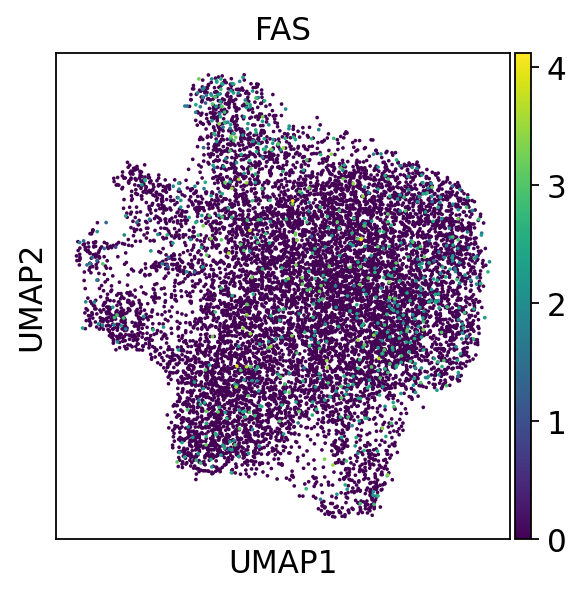

In [60]:
## look for CD8+ memory T ？？？没找到合适的marker
## FAS即CD95 
sc.pl.umap(adata_T, color=[''])

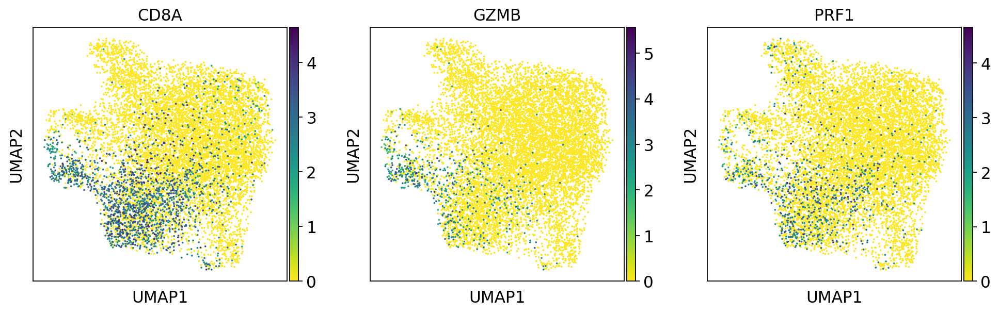

In [38]:
## look for CD8+ cytotoxic T 
## 
sc.pl.umap(adata_T, color=['CD8A','GZMB','PRF1'])

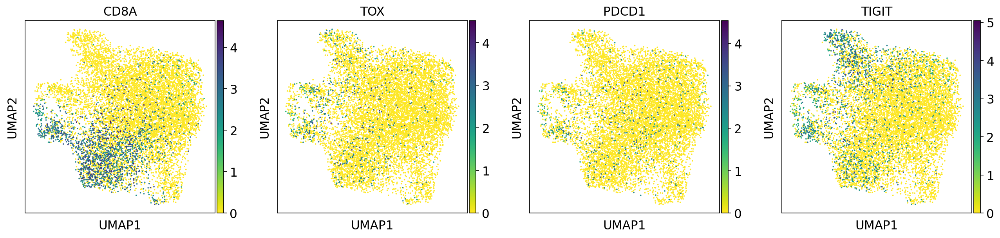

In [39]:
## look for CD8+ terminally exhausted T 
## 
sc.pl.umap(adata_T, color=['CD8A','TOX','PDCD1','TIGIT'])

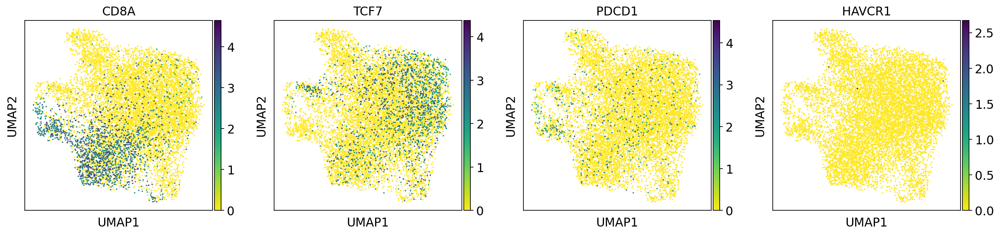

In [40]:
## look for CD8+ progenitor exhausted T 
## HAVCR1=TIM1
sc.pl.umap(adata_T, color=['CD8A','TCF7','PDCD1','HAVCR1'])

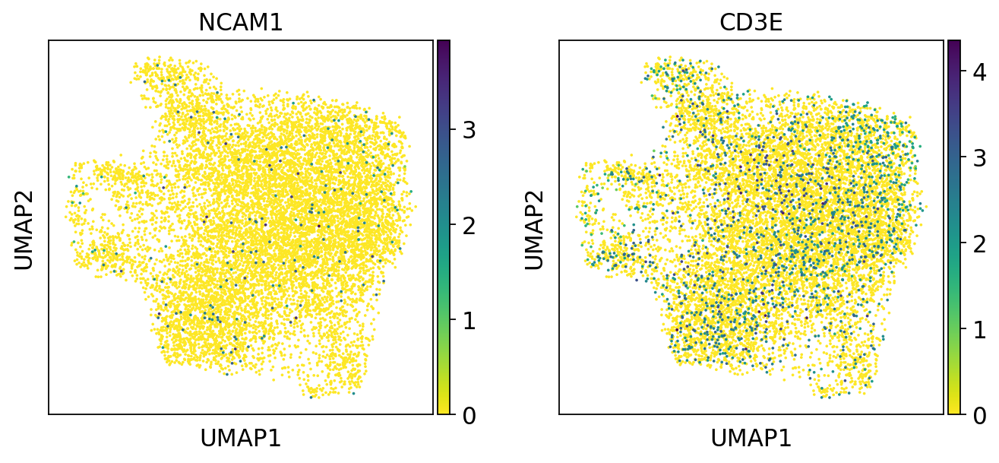

In [41]:
## look for NKT
## CD56=NCAM1
sc.pl.umap(adata_T, color=['NCAM1','CD3E'])

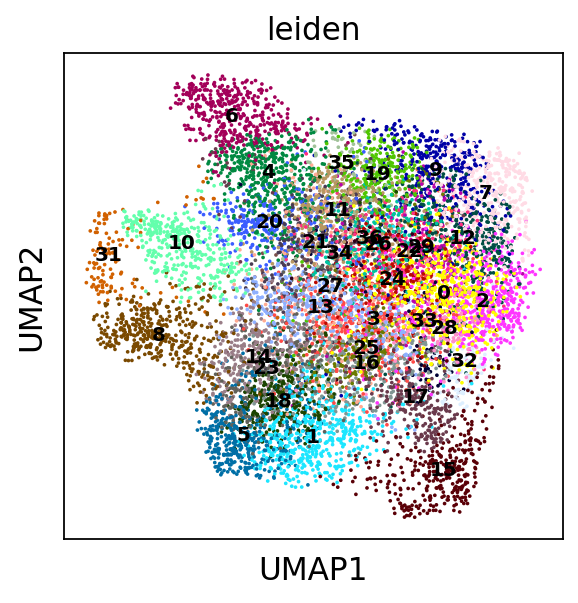

In [42]:
sc.pl.umap(adata_T, color=['leiden'],legend_loc='on data',legend_fontsize=9)

In [60]:
#import scanpy.api as sc
import matplotlib.pyplot as plt
import seaborn as sns
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props

def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig